# The impact of contact tracing: simulation study

Author: [Marc Lelarge](https://www.di.ens.fr/~lelarge/)

Date: 04/19


I am puzzled by the fact that the current debate around a possible tracking app is focusing on the privacy issue instead of its relevance for containing the virus. If we are ready to give our geolocation data to avoid a traffic jam, I think we would do the same to save lives...

Efficiency of contact tracing in term of epidemics containment should be evaluated by experts. Indeed evaluating contact tracing in the real world is a complex problem requiring expertise from epidemiologists, computer scientists, sociologists, economists...
There are quite a few limitations to the current proposals for contact tracing as it is very well explained by Ross Anderson in [Contact Tracing in the Real World](https://www.lightbluetouchpaper.org/2020/04/12/contact-tracing-in-the-real-world/). But technology will probably play a crucial role if it is shown to be efficient and if public trust it. 

To build trust, technical solutions should be explained and discussed in public. This is the main goal of this note. I explain the impact of contact tracing on a simple model through simulations. This model is designed to be as simple as possible and is not able to evaluate the efficiency of contact tracing in the real world. Nevertheless, this model allows us to understand some qualitative results that will be relevant for the current crisis.

## Short description of the model: 

The model consists of 4 compartments: S for the number of susceptible, I for the number of infectious, Sy for the number of sick (i.e. developing symptoms) and R for the number of recovered or deceased (or immune) individuals. The main assumptions of the model are:
 - only infectious individuals will propagate the virus to susceptible individuals. 
 - all infectious individuals will become after some time sick individuals with symptoms (there are no asymptomatic cases) and eventually recovered individuals.
 - sick individuals are not transmitting the virus (for example, they are isolated).
 - recovered individuals cannot be infected anymore.
  
In such a model, if infectious individuals could be detected and isolated, the virus would not propagate. As a result, with a global lockdown (i.e. isolating everybody), the epidemics stops once all individuals infected at the beginning of the lockdown recover. However, to achieve the same result it would be sufficient to just isolate these infected individuals. Indeed, the set of infectious individuals is the minimal set of individuals to isolate to stop the epidemics. The question is then: can contact tracing (or any other technology) help identifying these infectious individuals?

To model contact tracing, we simulate individuals moving in random directions. Each time, two individuals are sufficiently close, their IDs are exchanged. When an individual becomes sick, any individual who met him/her in the last few days is put in isolation for a few days. We see that contact tracing can help mitigating the epidemics by isolating infectious individuals who will not be able to propagate the virus and by isolating susceptible individuals who will not get infected. How effective will contact tracing be?

More details about the model used below: a susceptible individual getting infected, will stay a random time in state Infectious (uniform [2,5] days) and then become sick for another random time before recovering. The time to recover since infection is uniform [9,11] days. As soon as an individual becomes sick, he is developing symptoms and is put in isolation: she/he cannot contaminate anymore. 

Individuals in isolation are not moving in the simulations below. Each moving individual follows a random waypoint mobility model and they have all the same speed. 
The radius of contagion and of contact is the same (3 pixels) and the probability of contagion when contact is 0.6. The initial fraction of Infectious is 5% of the population.

For the contact tracing scenario, if in contact within the previous 5 days, an individual will immediately go in isolation for 5 days. We assume that all individuals having the contact tracing application follow the rules. We study different scenarios depending on the fraction of the population having the contact tracing application. If an individual does not have the application, she/he follows the original model and is put in isolation only if she/he develops symptoms.

# Qualitative conclusions:

Results below are obtained through extensive simulations (each number is obtaineb by averaging over 150 simulations).

Without contact tracing, around 92% (+/- 4%) of the population is infected with around the same fraction of the population sick at the peak.

![no tracing](images/no_tracing.png)

With all the population using contact tracing, 49% (+/- 16%) of the population is infected with a peak of sick population at the same level. During the peak of the epidemics, around 70% of the susceptible and infectious population (i.e. the population not having or not aware of having the virus) is actually put in isolation.

![tracing](images/tracing.png)

With half of the population using contact tracing, 80% (+/- 8%) of the population is infected with a peak of sick population at the same level.

![half tracing](images/half_tracing.png)

In this model, contact tracing (which is strictly observed by everybody) contains the epidemics by enforcing a 'smooth' lockdown around the peak of the epidemics but we see that its efficiency decreases if only a fraction of the population uses the contact tracing application. We can be a bit more quantitative here:

## the efficiency of contact tracing increases with the square of the population using it

This is a typical [network effect](https://en.wikipedia.org/wiki/Network_effect), well-known in economics. Contact tracing is more and more efficient as the number of individuals increases. Indeed, the efficiency of contact tracing increases with the square of the fraction using it. This is shown in the two figures below. The first one gives the number of non-infected (i.e. still susceptible) individuals at the end of the epidemics as a function of the fraction of the population using contact tracing. We see that the spread of the epidemics increases as the square of this fraction.

![non infected](images/non_infected.png)

The second figure below shows the number of sick individuals at the peak of the epidemics as a function of the fraction of the population using contact tracing. We see that this number decreases as a quadratic function of this fraction.

![max symptoms](images/max_symptoms.png)

Our model can help us understand what contact tracing really does. For example, coming back to the case where half the population is using contact tracing, we can now plot the dynamics for the population of susceptible and infectious individuals and see what proportion of this population is put in isolation by the contact tracing application. In the figure below, we see that contact tracing seems not to be able to detect infectious individuals early on:

![](images/half_tracing_isolation.png)

# Tracing vs Testing strategies

In order to evaluate the performance of contact tracing, we can compare this strategy with a pure testing strategy: individuals are tested at a given frequency and if the test is positive, they are isolated. For simplicity, we assume that all tests are accurate and results are observed instantly.

If I am able to test the whole population right at the beginning of the epidemics, then all infectious individuals will be isolated and the epidemics will not spread at all. If I am not able to test the whole population at the beginning, then some of the infectious individuals will spread the epidemics while others will be put in isolation, so we see that the performance of testing will decrease with less frequent tests.

In order to compare the two strategies, I define a **proxy for the economic cost** of the strategy which is the sum of the time spent by the whole population in isolation and a **proxy for the health benefits** of the strategy which is the number of individuals who did not get infected at all (i.e. who are still susceptible at the end of the epidemics). A good strategy should minimize the economic cost while maximizing the health benefit. The results are given below. The lockdown corresponds to the green point in the right top corner: all individuals are isolated for 5 days and the epidemics does not spread at all.

The red points correspond to the contact tracing strategy for different fraction of the population using it. Clearly the health benefits increase with this fraction but the economic cost also increases. Indeed with 100% of the population using contact tracing, we see that we wold have been better off with a lockdown as the economic cost is the same but the health benefits are much worse.

The blue points correspond to the testing strategy for different test frequencies: the label corresponds to the number of days between 2 successive tests for the same individual. We see that if each individual is tested every 7 days, the testing strategy gives results similar to the contact tracing strategy followed by 30% of the population. But if we are able to increase the frequency of the tests, we see that the testing strategy improves a lot in term of health benefits. Indeed at some point, this benefits are sufficient to reduce the total population of infectious individuals so that the economic cost starts to decrease while the health benefits still increase. On the particular model studied here, the tipping point seems to be around one test every 3,5 days.

![](images/tracing_test.png)

# Code available [here](https://github.com/mlelarge/fitting_model_epidemiology/blob/master/Impact_tracing_simulation.ipynb)

## This model is not predictive for the COVID-19

Precise numbers given above are not relevant in the current context but I hope that the qualitative conclusions and the comparison between these numbers allows us to understand better tracing and testing strategies.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import numpy as np
from simulation.simulation_tracing import Simu
from simulation.utils import make_anim

## ! Numbers vary between experiments !

# 1. No contact tracing

In [2]:
simu_notracing = Simu(n=1000,n_time=300, p_contact=0.0)

In [3]:
simu_notracing.make_simu()

In [4]:
infected_n = simu_notracing.all_infected()
susceptible_n = simu_notracing.all_susceptible()
symptoms_n = simu_notracing.all_symptoms()
recovered_n = simu_notracing.all_last()

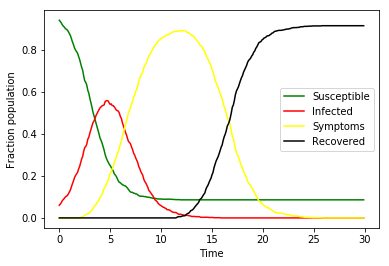

In [5]:
plt.plot(np.arange(0,30,0.1),susceptible_n, 'green', label='Susceptible')
plt.plot(np.arange(0,30,0.1),infected_n, 'red', label='Infected')
plt.plot(np.arange(0,30,0.1),symptoms_n, 'yellow', label='Symptoms')
plt.plot(np.arange(0,30,0.1),recovered_n, 'black', label='Recovered')
plt.xlabel("Time")
plt.ylabel("Fraction population")
plt.legend();

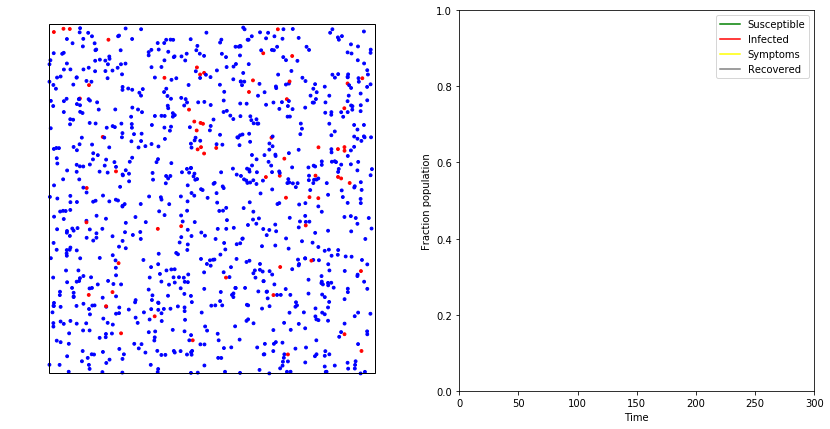

In [6]:
anim = make_anim(simu_notracing);

In [7]:
HTML(anim.to_html5_video())

# 2. Contact tracing

In [8]:
simu_tracing = Simu(n=1000,n_time=300, delta_time = 50, time_protected = 50)

In [9]:
simu_tracing.make_simu()

In [10]:
infected_t = simu_tracing.all_infected()
susceptible_t = simu_tracing.all_susceptible()
symptoms_t = simu_tracing.all_symptoms()
recovered_t = simu_tracing.all_last()

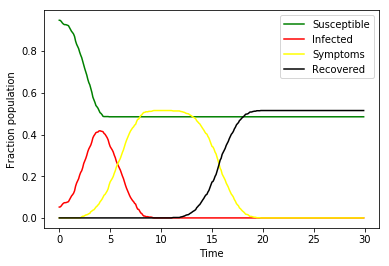

In [11]:
plt.plot(np.arange(0,30,0.1),susceptible_t, 'green', label='Susceptible')
plt.plot(np.arange(0,30,0.1),infected_t, 'red', label='Infected')
plt.plot(np.arange(0,30,0.1),symptoms_t, 'yellow', label = 'Symptoms')
plt.plot(np.arange(0,30,0.1),recovered_t, 'black', label='Recovered')
plt.xlabel("Time")
plt.ylabel("Fraction population")
plt.legend();

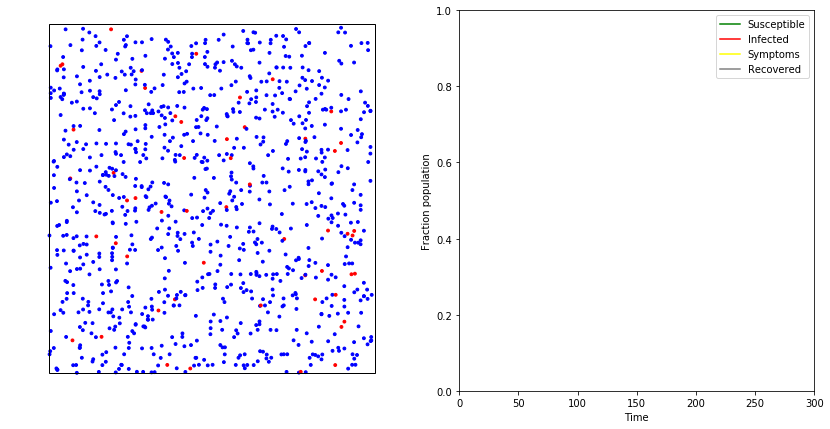

In [12]:
anim = make_anim(simu_tracing);

In [13]:
HTML(anim.to_html5_video())

The color of the individuals are:
 - green for Susceptible in isolation (fixed)
 - blue for Susceptible not in isolation (moving)
 - orange for Infectious in isolation (fixed)
 - red for Infectious not in isolation (moving)
 - yellow for Symptoms in isolation (fixed)
 - grey for Recovered (moving or fixed)

In [14]:
p_infected = simu_tracing.all_protected_infected()
p_susceptible = simu_tracing.all_protected_susceptible()
p_symptoms = simu_tracing.all_protected_symptoms()
p_recovered = simu_tracing.all_protected_last()

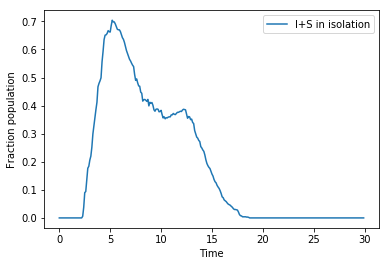

In [15]:
#plt.plot(np.arange(0,30,0.1),p_susceptible+p_symptoms+p_infected+p_recovered)
plt.plot(np.arange(0,30,0.1),p_susceptible+p_infected, label="I+S in isolation")
plt.xlabel("Time")
plt.ylabel("Fraction population")
plt.legend();

Fraction of I + S in isolation as a fraction of the total population.

# 3. Partial contact tracing

Here, we assume that only half of the population implements the contact tracing rule. Parameter `p_contact` below.

In [16]:
simu_partialtracing = Simu(n=1000,n_time=300, delta_time = 50, time_protected = 50, p_contact=0.5)

In [17]:
simu_partialtracing.make_simu()

In [18]:
infected_pt = simu_partialtracing.all_infected()
susceptible_pt = simu_partialtracing.all_susceptible()
symptoms_pt = simu_partialtracing.all_symptoms()
recovered_pt = simu_partialtracing.all_last()

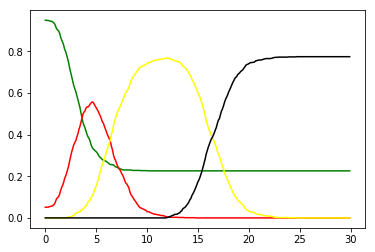

In [19]:
plt.plot(np.arange(0,30,0.1),susceptible_pt, 'green', label='Susceptible')
plt.plot(np.arange(0,30,0.1),infected_pt, 'red', label='Infected')
plt.plot(np.arange(0,30,0.1),symptoms_pt, 'yellow', label='Symptoms')
plt.plot(np.arange(0,30,0.1),recovered_pt, 'black', label ='Recovered')

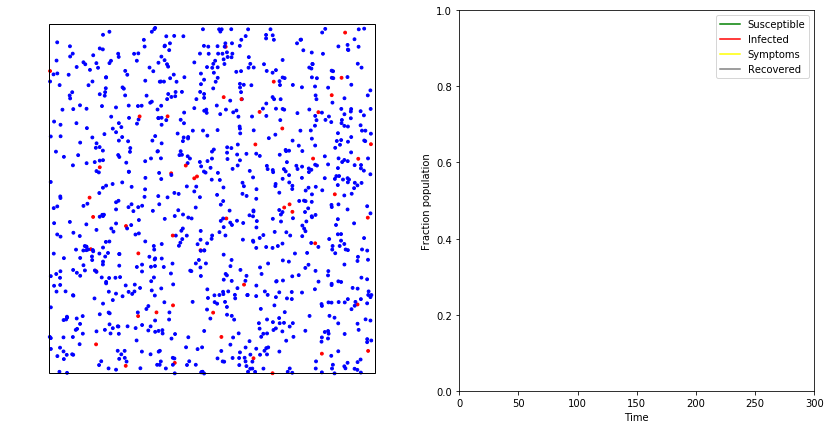

In [20]:
anim = make_anim(simu_partialtracing);

In [21]:
HTML(anim.to_html5_video())

The color of the individuals are:
 - green for Susceptible in isolation (fixed)
 - blue for Susceptible not in isolation (moving)
 - orange for Infectious in isolation (fixed)
 - red for Infectious not in isolation (moving)
 - yellow for Symptoms in isolation (fixed)
 - grey for Recovered (moving or fixed)

# 4. Testing strategy

In [22]:
simu_partialtest = Simu(n=1000,n_time=300, p_contact=0.0, time_test=35)

In [23]:
simu_partialtest.make_simu_test()

In [24]:
infected_pte = simu_partialtest.all_infected()
susceptible_pte = simu_partialtest.all_susceptible()
symptoms_pte = simu_partialtest.all_symptoms()
recovered_pte = simu_partialtest.all_last()
p_infected_pte = simu_partialtest.all_protected_infected()

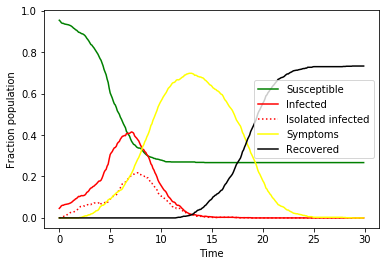

In [25]:
plt.plot(np.arange(0,30,0.1),susceptible_pte, 'green', label='Susceptible')
plt.plot(np.arange(0,30,0.1),infected_pte, 'red', label='Infected')
plt.plot(np.arange(0,30,0.1),p_infected_pte, 'red', ls='dotted', label= 'Isolated infected')
plt.plot(np.arange(0,30,0.1),symptoms_pte, 'yellow', label='Symptoms')
plt.plot(np.arange(0,30,0.1),recovered_pte, 'black', label='Recovered')
plt.xlabel("Time")
plt.ylabel("Fraction population")
plt.legend();

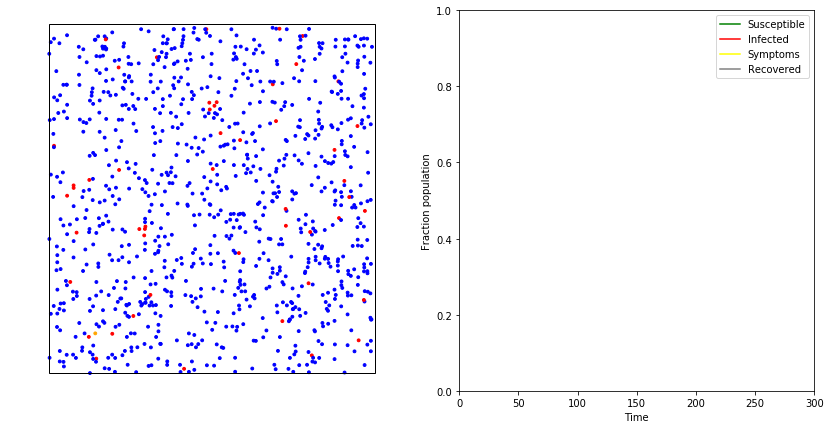

In [26]:
anim = make_anim(simu_partialtest);

In [27]:
HTML(anim.to_html5_video())